In [67]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [68]:
url = r"C:\Users\gonza\Downloads\melb_data.csv\melb_data.csv"
data = pd.read_csv(url,parse_dates=["Date"])
data.head(3)

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-03-12,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0


In [69]:
# vemos nullos
def show_nam_df(x):
    nulos = x.isnull().sum()
    col_nul = nulos[nulos > 0]
    col_por = round((col_nul / len(x)) * 100,2)
    df_nul = pd.DataFrame(data={"Total":col_nul,"Porcentaje":col_por})
    return df_nul

In [70]:
show_nam_df(data)

,Total,Porcentaje
Car,62,0.46
BuildingArea,6450,47.50
YearBuilt,5375,39.58
CouncilArea,1369,10.08


In [71]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         13580 non-null  object        
 1   Address        13580 non-null  object        
 2   Rooms          13580 non-null  int64         
 3   Type           13580 non-null  object        
 4   Price          13580 non-null  float64       
 5   Method         13580 non-null  object        
 6   SellerG        13580 non-null  object        
 7   Date           13580 non-null  datetime64[ns]
 8   Distance       13580 non-null  float64       
 9   Postcode       13580 non-null  float64       
 10  Bedroom2       13580 non-null  float64       
 11  Bathroom       13580 non-null  float64       
 12  Car            13518 non-null  float64       
 13  Landsize       13580 non-null  float64       
 14  BuildingArea   7130 non-null   float64       
 15  YearBuilt      8205

In [72]:
# descripcion variables numericas
data.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,13580.000000,1.358000e+04,13580.000000,13580.000000,13580.000000,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,10.137776,3105.301915,2.914728,1.534242,1.610075,558.416127,151.967650,1964.684217,-37.809203,144.995216,7454.417378
std,0.955748,6.393107e+05,5.868725,90.676964,0.965921,0.691712,0.962634,3990.669241,541.014538,37.273762,0.079260,0.103916,4378.581772
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,1.000000,177.000000,93.000000,1940.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,9.200000,3084.000000,3.000000,1.000000,2.000000,440.000000,126.000000,1970.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.000000,651.000000,174.000000,1999.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,10.000000,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


In [73]:
# descripcion variables categoricas
data.describe(include="object")

,Suburb,Address,Type,Method,SellerG,CouncilArea,Regionname
count,13580,13580,13580,13580,13580,12211,13580
unique,314,13378,3,5,268,33,8
top,Reservoir,36 Aberfeldie St,h,S,Nelson,Moreland,Southern Metropolitan
freq,359,3,9449,9022,1565,1163,4695


In [74]:
# Vamos a trabajar con una copia, sin las columnas con mas nan ( son demasiados)
cols_remove = ["BuildingArea","YearBuilt"]
data_remove = data.copy().drop(cols_remove,axis=1)


In [155]:
# distribucion por tipo de casa (incluyo el porcentaje sobre el total en el dataset)
# quito postcode y latitude porque no me interesa
type_remove = ["Postcode","Lattitude","Longtitude"]
type_porcentaje = round(data_remove.groupby("Type").size() / len(data) * 100,2)
type_df = data_remove.drop(type_remove,axis=1).groupby("Type").mean()
type_df["Percentage"] = type_porcentaje.values
type_df.sort_values(by="Price",ascending=False)

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,Propertycount,Percentage
Type,,,,,,,,,
h,3.260874,1.242665e+06,10.979479,3.229336,1.613822,1.771222,617.181924,7259.025505,69.58
t,2.837522,9.337351e+05,9.851346,2.814183,1.809695,1.555655,279.606822,7094.459605,8.20
u,1.963871,6.051275e+05,7.607391,1.966523,1.183295,1.128358,477.314219,8199.280080,22.22


In [156]:
# describe por region name ( puedo hacer lo mismo con suburbios pero son demasidos)
region_porcentaje = round(data_remove.groupby("Regionname").size() / len(data) *100,2)
region_df = data_remove.drop(type_remove,axis=1).groupby("Regionname").mean()
region_df["Percentage"] = region_porcentaje.values
region_df.sort_values(by="Price",ascending=False)

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,Propertycount,Percentage
Regionname,,,,,,,,,
Southern Metropolitan,2.860916,1.372963e+06,8.756656,2.835144,1.624068,1.576264,509.252183,7622.279233,34.57
Eastern Metropolitan,3.322230,1.104080e+06,13.901088,3.313392,1.698844,1.792916,634.133923,5713.788579,10.83
South-Eastern Metropolitan,3.360000,9.229438e+05,23.813556,3.355556,1.657778,2.044444,613.991111,6589.366667,3.31
Northern Metropolitan,2.755527,8.981711e+05,8.078329,2.734190,1.367866,1.454123,568.948072,9485.602057,28.65
Western Metropolitan,3.023406,8.664205e+05,10.104579,2.990502,1.501018,1.696392,493.606852,5561.785957,21.71
Eastern Victoria,3.396226,6.999808e+05,34.209434,3.396226,1.811321,2.056604,2949.698113,8872.358491,0.39
Northern Victoria,3.560976,5.948293e+05,33.748780,3.560976,1.853659,1.925000,3355.463415,4260.975610,0.30
Western Victoria,3.406250,3.975234e+05,30.753125,3.406250,1.468750,1.843750,655.500000,4191.156250,0.24


In [77]:
def describe_porcentaje(data,column):
    region_porcentaje = round(data.groupby(column).size() / len(data) *100,2)
    region_df = data.drop(type_remove,axis=1).groupby(column).mean()
    region_df["Percentage"] = region_porcentaje.values
    return region_df.sort_values(by="Percentage",ascending=False)

In [175]:
describe_porcentaje(data_remove,"Method").style.background_gradient(cmap='Blues')

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,Propertycount,Percentage
Method,,,,,,,,,
S,2.941809,1087327.145201,10.431523,2.914875,1.498781,1.602581,531.129905,7496.049435,66.440000
SP,2.795655,899892.422783,10.374692,2.785672,1.456254,1.560472,469.346447,7093.759248,12.540000
PI,3.077366,1133242.007033,9.482097,3.062660,1.714194,1.703918,521.682864,7749.644501,11.520000
VB,2.924103,1166510.425354,8.273728,2.896580,1.675563,1.602359,927.331943,7307.331943,8.830000
SA,3.010870,1025771.739130,12.385870,3.010870,1.554348,1.769231,699.532609,6945.902174,0.680000


### modelo

In [79]:
data_remove.columns

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'CouncilArea', 'Lattitude', 'Longtitude', 'Regionname',
       'Propertycount'],
      dtype='object')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000162748DE6D0>,
      dtype=object)

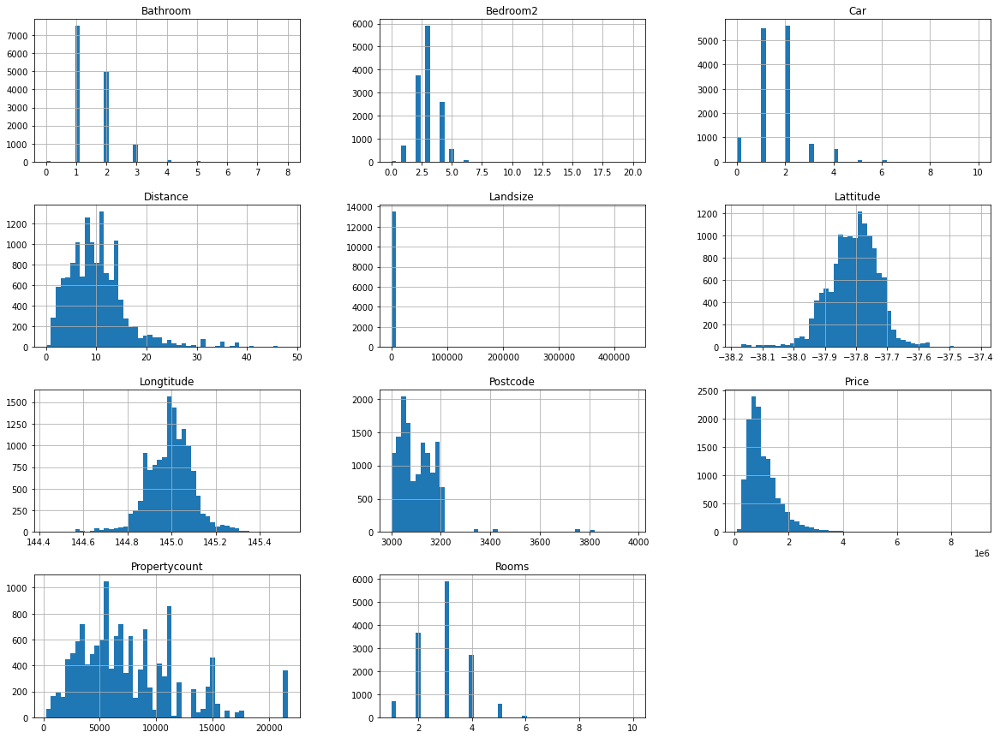

In [136]:

data_remove.hist(bins=50,figsize=(20,15))

In [108]:
cols_remove_model = ["Postcode","Suburb","Address",'Method','SellerG']

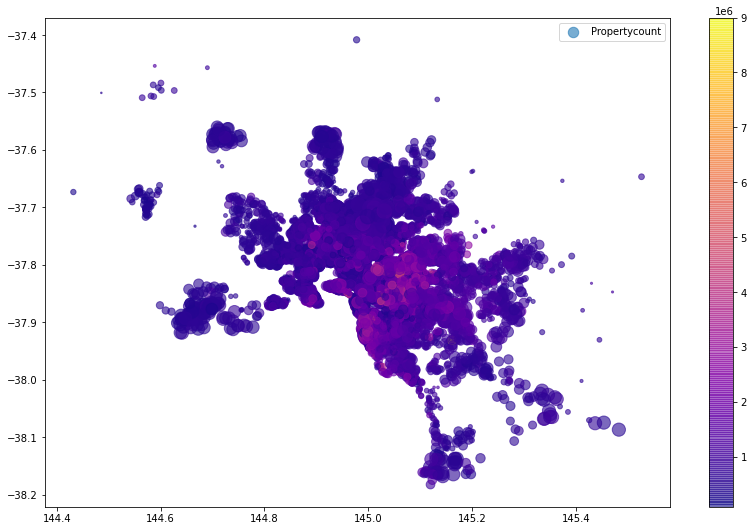

In [179]:

plt.figure(figsize=(14,9))
plt.scatter(x="Longtitude",y="Lattitude",data=data_remove,c="Price", alpha=0.6,cmap='plasma',
                s=data_remove["Propertycount"]/100,label="Propertycount")
plt.legend()
plt.colorbar()

This image tells you that the housing prices are very much related to the location
(e.g., close to the ocean) and to the population density, as you probably knew already.

In [110]:
# corr
corr = data_remove.corr()
pd.DataFrame(corr["Price"].sort_values(ascending=False)).style.background_gradient(cmap='viridis')

,Price
Price,1.000000
Rooms,0.496634
Bedroom2,0.475951
Bathroom,0.467038
Car,0.238979
Longtitude,0.203656
Postcode,0.107867
Landsize,0.037507
Propertycount,-0.042153
Distance,-0.162522


The correlation coefficient ranges from –1 to 1. When it is close to 1, it means that
there is a strong positive correlation; for example, the median house value tends to go
up when the median income goes up. When the coefficient is close to –1, it means
that there is a strong negative correlation; you can see a small negative correlation
between the latitude and the median house value (i.e., prices have a slight tendency to
go down when you go north). Finally, coefficients close to zero mean that there is no
linear correlation

In [161]:
corr.style.background_gradient(cmap='Blues')

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,Lattitude,Longtitude,Propertycount
Rooms,1.000000,0.496634,0.294203,0.055303,0.944190,0.592934,0.408483,0.025678,0.015948,0.100771,-0.081530
Price,0.496634,1.000000,-0.162522,0.107867,0.475951,0.467038,0.238979,0.037507,-0.212934,0.203656,-0.042153
Distance,0.294203,-0.162522,1.000000,0.431514,0.295927,0.127155,0.262994,0.025004,-0.130723,0.239425,-0.054910
Postcode,0.055303,0.107867,0.431514,1.000000,0.060584,0.113664,0.050289,0.024558,-0.406104,0.445357,0.062304
Bedroom2,0.944190,0.475951,0.295927,0.060584,1.000000,0.584685,0.405325,0.025646,0.015925,0.102238,-0.081350
Bathroom,0.592934,0.467038,0.127155,0.113664,0.584685,1.000000,0.322246,0.037130,-0.070594,0.118971,-0.052201
Car,0.408483,0.238979,0.262994,0.050289,0.405325,0.322246,1.000000,0.026770,-0.001963,0.063395,-0.024295
Landsize,0.025678,0.037507,0.025004,0.024558,0.025646,0.037130,0.026770,1.000000,0.009695,0.010833,-0.006854
Lattitude,0.015948,-0.212934,-0.130723,-0.406104,0.015925,-0.070594,-0.001963,0.009695,1.000000,-0.357634,0.047086
Longtitude,0.100771,0.203656,0.239425,0.445357,0.102238,0.118971,0.063395,0.010833,-0.357634,1.000000,0.065988


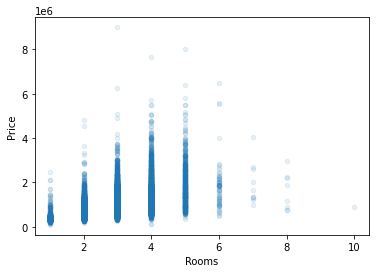

In [111]:
# vamos a dibujar rooms/precio
data_remove.plot(kind="scatter",x="Rooms",y="Price",alpha=0.1)

### experimentos con datetime

In [112]:
# calcular numero dias desde venta (no lo usaremos porque no estamos seguro de que hacer con ellos)
from datetime import date

In [113]:
pd.to_datetime(date.today()) - data_remove['Date']

0       1734 days
1       1713 days
2       1347 days
3       1347 days
4       1709 days
           ...   
13575   1202 days
13576   1202 days
13577   1202 days
13578   1202 days
13579   1202 days
Name: Date, Length: 13580, dtype: timedelta64[ns]

# usando days con sequimos extraemos el dia en el formato datetime


In [114]:
days_sold = (pd.to_datetime(date.today()) - data_remove['Date']).dt.days.astype("int")

In [115]:
days_sold

0        1734
1        1713
2        1347
3        1347
4        1709
         ... 
13575    1202
13576    1202
13577    1202
13578    1202
13579    1202
Name: Date, Length: 13580, dtype: int32

In [116]:
# vemos que no influye mucho los dias pasado desde la venta respecto al precio

Text(0, 0.5, 'precio')

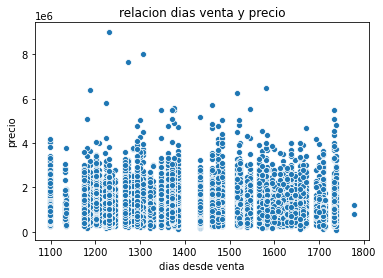

In [117]:
sns.scatterplot(x=days_sold.to_numpy(),y=data_remove.Price.to_numpy())
plt.title("relacion dias venta y precio")
plt.xlabel("dias desde venta")
plt.ylabel("precio")

### modelo ahora si

In [118]:
data_remove.columns

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'CouncilArea', 'Lattitude', 'Longtitude', 'Regionname',
       'Propertycount'],
      dtype='object')

In [119]:
cols_remove_model = ["Postcode","Suburb","Address",'Method','SellerG',"Date"]

In [120]:
data_model = data_remove.copy().drop(cols_remove_model,axis=1)


In [121]:
data_model.head(3)

,Rooms,Type,Price,Distance,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,2,h,1480000.0,2.5,2.0,1.0,1.0,202.0,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,2,h,1035000.0,2.5,2.0,1.0,0.0,156.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,3,h,1465000.0,2.5,3.0,2.0,0.0,134.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0


In [122]:
X = data_model.drop("Price",axis=1)
y = data_model["Price"]

In [123]:
show_nam_df(data_model)

,Total,Porcentaje
Car,62,0.46
CouncilArea,1369,10.08


In [124]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LinearRegression

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

### Step 1: Define Preprocessing Steps¶
Similar to how a pipeline bundles together preprocessing and modeling steps, we use the ColumnTransformer class to bundle together different preprocessing steps. The code below:

In [125]:
categorical_cols=[x for x in data_model.columns.values if data_model[x].dtype == "object"]
numerical_cols = [x for x in X.columns.values if x not in categorical_cols]

In [126]:
# prepocesing numerical data
numerical_transformer = Pipeline(steps=[
    ("imputer",SimpleImputer(strategy="median")),
    ("scaler",StandardScaler())
])
# prepocesing categorical data
categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot",OneHotEncoder(handle_unknown="ignore"))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

### Step 2: Define the Model

In [141]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [128]:
def pipeline_score(X_train, X_test, y_train, y_test,model):

    # Bundle preprocessing and modeling code in a pipeline
    my_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                ('model', model)
                                ])

    # Preprocessing of training data, fit model 
    my_pipeline.fit(X_train, y_train)

    # Preprocessing of validation data, get predictions
    preds = my_pipeline.predict(X_test)

    # Evaluate the model
    score = my_pipeline.score(X_train, y_train)
    score_test = my_pipeline.score(X_test,y_test)
    print('train score:', score)
    print('test score:', score_test)

In [129]:
pipeline_score(X_train, X_test, y_train, y_test,LinearRegression())

train score: 0.6133332226752404
test score: 0.6340841577184357


In [148]:
from sklearn.ensemble import RandomForestRegressor
pipeline_score(X_train, X_test, y_train, y_test,RandomForestRegressor(max_depth=10, min_samples_leaf=2,random_state=0,n_estimators=200))

train score: 0.8897176818523148
test score: 0.7567157839187003


In [131]:
### tenemos que remover outliers despues del prepocesado(solo numerico ¡¡¡) o antes si usamos manual

In [132]:
# outliers
from sklearn.ensemble import IsolationForest

def outliers(X_train,y_train):
    #outliers
    iso = IsolationForest(contamination=0.1)
    yhat = iso.fit_predict(X_train)

    # select all rows that are not outliers
    mask = yhat != -1
    X_train, y_train = X_train[mask, :], y_train[mask]
    return X_train, y_train



In [146]:
from sklearn.ensemble import GradientBoostingRegressor
pipeline_score(X_train, X_test, y_train, y_test,GradientBoostingRegressor(random_state=0,n_estimators=100,max_features='sqrt',max_depth=10))

train score: 0.9711106817630628
test score: 0.7844139417079585


### separar por modulos mejor para que no sea tan lento

In [134]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
def pipeline_score_bestcv(X_train, X_test, y_train, y_test,model):

    #param
    random_grid = { "model__max_depth": [10, 20, 30, 40],
                    'model__max_features': ['auto', 'sqrt'],
                    'model__min_samples_leaf': [1, 2, 4],
                    'model__min_samples_split': [2, 5, 10],
                    'model__n_estimators': [50,100,200, 400]}

    # Bundle preprocessing and modeling code in a pipeline
    my_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                ('model', model)
                                ])
    # kfold
    kfold = StratifiedKFold(n_splits=4,random_state=0)
    #grid
    grid = GridSearchCV(estimator=my_pipeline, param_grid=random_grid, n_jobs=-1, cv=kfold)
    grid_result = grid.fit(X_train, y_train)
    print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
    means = grid_result.cv_results_['mean_test_score']
    print(f"mean test score: {means}")
  

In [135]:
### xboost o ligh